<a href="https://colab.research.google.com/github/PUBPOL-2130/notebooks/blob/main/Week3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install -q census us folium geopandas colorcet

In [2]:
%config InlineBackend.figure_formats = ["retina"]

import matplotlib.pyplot as plt
import pandas as pd
import geopandas as gpd
import folium
import colorcet as cc

from census import Census

In [3]:
census = Census("", year=2020)

# Week 3: Exploring the U.S. Census, part 2 (units, hierarchies, the central spine, ACS)

Last week, we examined some of the demographic data published by the U.S. Census Bureau. That demographic data is associated with geographic units: for instance, we examined population by race (and Hispanic/Latin origin) at the county level. To make sense of this data beyond basic summary statistics, it is extremely useful to superimpose it on a map. This week, we'll explore how to download and visualize Census geographies, and we'll create combine demographic data with these geographies to create [choropleth maps](https://en.wikipedia.org/wiki/Choropleth_map).

## Loading geographical data

Census geographies are published as _shapefiles_. The [ESRI shapefile format](https://en.wikipedia.org/wiki/Shapefile) is extremely popular among GIS (geographic information systems) practictioners, and any serious mapping tool (such as [ArcGIS](https://www.arcgis.com/index.html)) can read shapefiles. [GeoPandas](https://geopandas.org/en/stable/getting_started/introduction.html) is a Python package that extends Pandas to support reading shapefiles and plotting geographies; we'll use this package extensively in the coming weeks to build geospatial visualizations. Let's start by downloading a shapefile containing the outlines of all U.S. counties from the Census website.

In [4]:
#!curl -O https://web.archive.org/web/20241002004532if_/https://www2.census.gov/geo/tiger/TIGER2024/COUNTY/tl_2024_us_county.zip
!curl -O https://www2.census.gov/geo/tiger/TIGER2024/COUNTY/tl_2024_us_county.zip



  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 80.0M  100 80.0M    0     0  78.1M      0  0:00:01  0:00:01 --:--:-- 78.2M


In [5]:
county_gdf = gpd.read_file("tl_2024_us_county.zip").set_index("GEOID")

In [6]:
county_gdf.head(5)

,STATEFP,COUNTYFP,COUNTYNS,GEOIDFQ,NAME,NAMELSAD,LSAD,CLASSFP,MTFCC,CSAFP,CBSAFP,METDIVFP,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,geometry
GEOID,,,,,,,,,,,,,,,,,,
31039,31,039,00835841,0500000US31039,Cuming,Cuming County,06,H1,G4020,None,None,None,A,1477563042,10772508,+41.9158651,-096.7885168,"POLYGON ((-96.55525 41.82892, -96.55524 41.827..."
53069,53,069,01513275,0500000US53069,Wahkiakum,Wahkiakum County,06,H1,G4020,None,None,None,A,680980773,61564428,+46.2946377,-123.4244583,"POLYGON ((-123.72755 46.2645, -123.72756 46.26..."
35011,35,011,00933054,0500000US35011,De Baca,De Baca County,06,H1,G4020,None,None,None,A,6016818941,29090018,+34.3592729,-104.3686961,"POLYGON ((-104.89337 34.08894, -104.89337 34.0..."
31109,31,109,00835876,0500000US31109,Lancaster,Lancaster County,06,H1,G4020,339,30700,None,A,2169269508,22850511,+40.7835474,-096.6886584,"POLYGON ((-96.68493 40.5233, -96.69219 40.5231..."
31129,31,129,00835886,0500000US31129,Nuckolls,Nuckolls County,06,H1,G4020,None,None,None,A,1489645201,1718484,+40.1764918,-098.0468422,"POLYGON ((-98.2737 40.1184, -98.27374 40.1224,..."


GeoPandas includes a `.plot()` function (similar to the `.plot.pie()` and `.plot.bar()` Pandas functions we saw last week). With this function, we can quickly get a sense of what `county_gdf` contains.

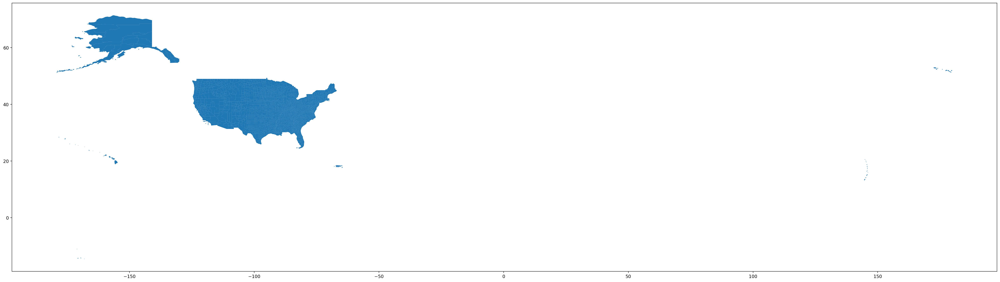

In [7]:
county_gdf.plot(figsize=(40, 80))
plt.show()

There's a problem with this initial visualization: it's mostly empty space! This is because the county shapefile covers _all_ territories of the U.S., including some Pacific territories (Guam, American Samoa, and the Northern Mariana Islands) that appear in the upper right of this plot. Let's narrow down the visualization to the continental U.S by filtering on FIPS code (conveniently, the outlying territories all have FIPS codes above 56).

In [8]:
# Filter out American Samoa, U.S. Virgin Islands, etc.
continental_gdf = county_gdf[
      (county_gdf.STATEFP <= "56")
    & (county_gdf.STATEFP != "02")  # exclude Alaska
    & (county_gdf.STATEFP != "15")  # exclude Hawaii
]

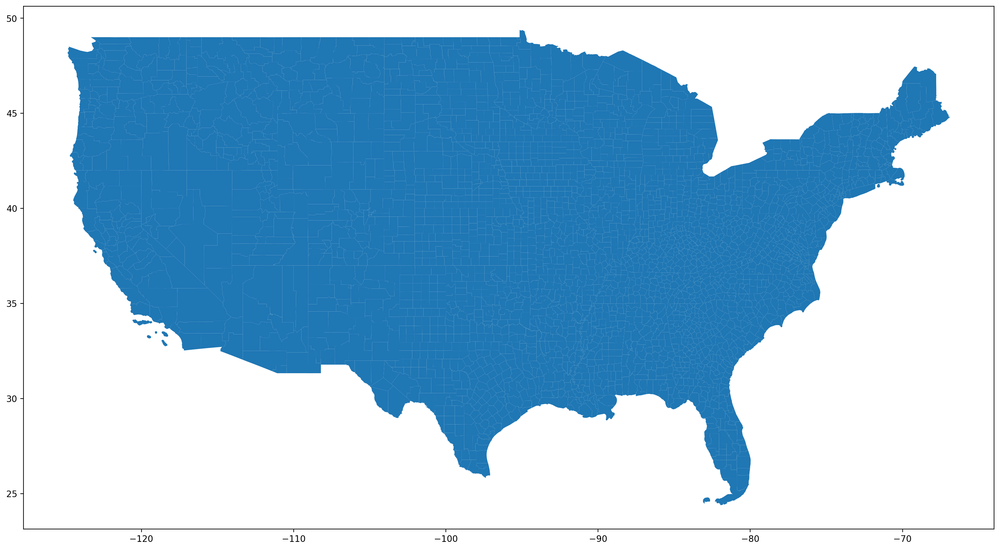

In [9]:
continental_gdf.plot(figsize=(20, 40))
plt.show()

That's better! Now, let's color the map by state (using the `STATEFP` column, which contains the state FIPS code for each county). Note that some of the state borders look a little odd (this effect is most pronounced in Michigan); this is because the Census geographies include some water areas.

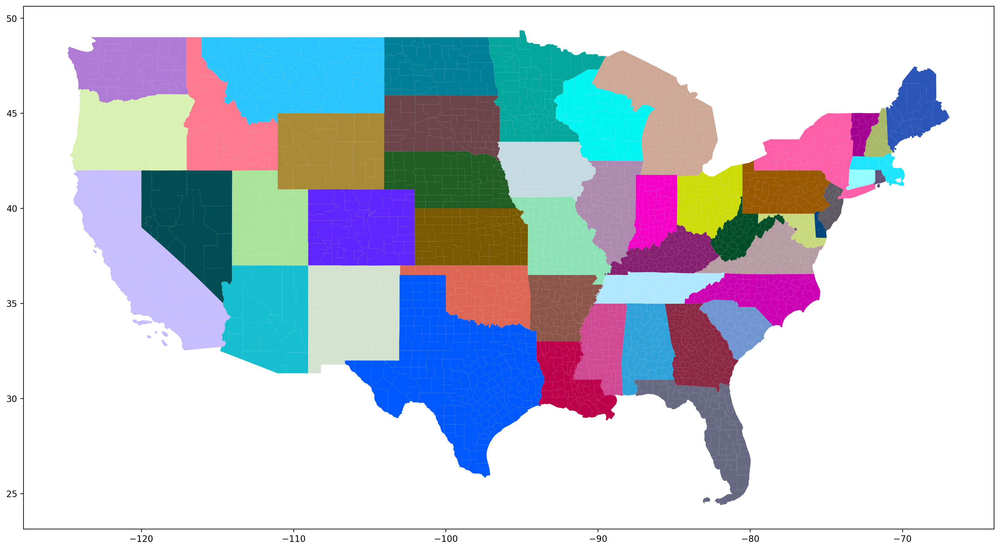

In [10]:
continental_gdf.plot(figsize=(20, 40), column="STATEFP", cmap=cc.cm.glasbey_hv)
plt.show()

## Choosing a map projection

You may have noticed something about the shape of the country not looking "right" -- that's because this is what the geographers call "unprojected," meaning that it uses latitude and longitude for its x and y coordinates directly, rather than transforming them to better represent either angles or areas.

ref:
* [Choosing the right map projection](https://source.opennews.org/articles/choosing-right-map-projection/)
* [geopandas.GeoDataFrame.plot()](https://geopandas.org/en/stable/docs/reference/api/geopandas.GeoDataFrame.plot.html)

In [11]:
continental_gdf.crs

<Geographic 2D CRS: EPSG:4269>
Name: NAD83
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: North America - onshore and offshore: Canada - Alberta; British Columbia; Manitoba; New Brunswick; Newfoundland and Labrador; Northwest Territories; Nova Scotia; Nunavut; Ontario; Prince Edward Island; Quebec; Saskatchewan; Yukon. Puerto Rico. United States (USA) - Alabama; Alaska; Arizona; Arkansas; California; Colorado; Connecticut; Delaware; Florida; Georgia; Hawaii; Idaho; Illinois; Indiana; Iowa; Kansas; Kentucky; Louisiana; Maine; Maryland; Massachusetts; Michigan; Minnesota; Mississippi; Missouri; Montana; Nebraska; Nevada; New Hampshire; New Jersey; New Mexico; New York; North Carolina; North Dakota; Ohio; Oklahoma; Oregon; Pennsylvania; Rhode Island; South Carolina; South Dakota; Tennessee; Texas; Utah; Vermont; Virginia; Washington; West Virginia; Wisconsin; Wyoming. US Virgin Islands. British Virgin Islands

In [12]:
continental_gdf = continental_gdf.to_crs("EPSG:2163")

In [13]:
continental_gdf.crs

<Projected CRS: EPSG:2163>
Name: US National Atlas Equal Area
Axis Info [cartesian]:
- X[east]: Easting (metre)
- Y[north]: Northing (metre)
Area of Use:
- name: United States (USA) - onshore and offshore.
- bounds: (167.65, 15.56, -65.69, 74.71)
Coordinate Operation:
- name: US National Atlas Equal Area
- method: Lambert Azimuthal Equal Area (Spherical)
Datum: Not specified (based on Clarke 1866 Authalic Sphere)
- Ellipsoid: Clarke 1866 Authalic Sphere
- Prime Meridian: Greenwich

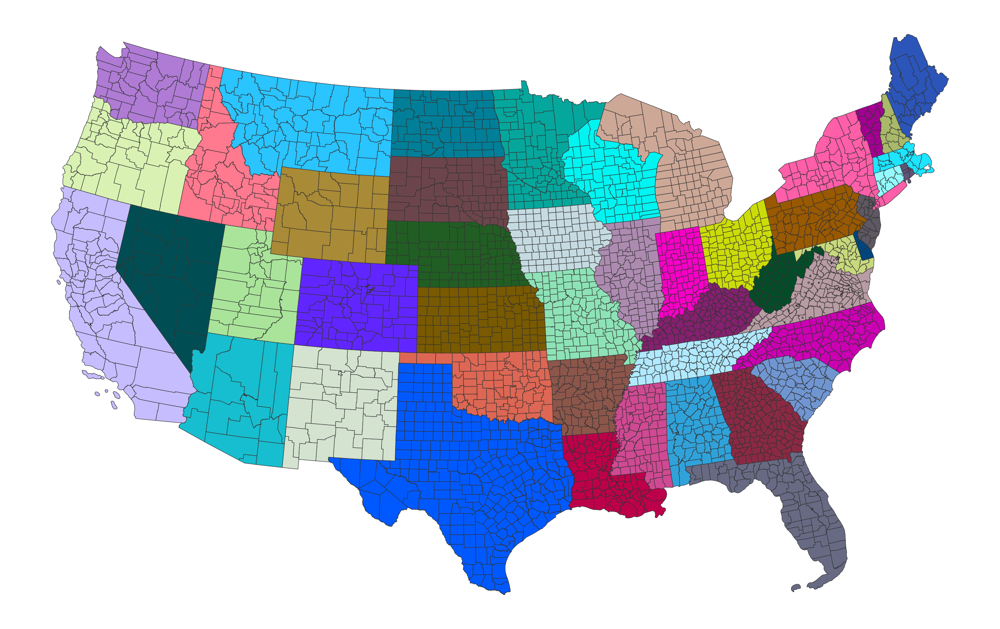

In [14]:
continental_gdf.plot(figsize=(20, 40), column="STATEFP", cmap=cc.cm.glasbey_hv, edgecolor="0.2", linewidth=0.5)
plt.axis("off")
plt.show()

## The Census unit hierarchy

The core Census geographic units are organized into hierarchy (sometimes referred to as _the central spine_): states contain counties, which contain _tracts_, which contain _block groups_, which contain _blocks_. States and counties are (mostly) static political units with boundaries generally not determined by the Census; tracts, block groups, and blocks are statistical units defined by the Census. These statistical units are subject to change for each decennial Census. Blocks are the most granular unit in this hierarchy, and [many Census blocks are unpopulated](https://mapsbynik.com/maps/census0pop/).

![U.S. Census central spine (source: University of Missouri)](https://mcdc.missouri.edu/geography/sumlevs/censusgeochart.png)

_(image credit: University of Missouri)_

The Census also publishes data for political and statistical areas that do not fall neatly in this spine. For instance, school districts nest in states, but they do not necessarily nest in counties; voting districts nest in counties, but not necessarily in tracts.

Let's examine how the state of New York is broken up into various Census units, starting with counties—the least granular unit (below the state level) on the central spine.

### Counties
The U.S. Census releases a county shapefile at the national level; to plot just the counties in New York, we need to filter by state FIPS code.

In [15]:
ny_county_gdf = continental_gdf[continental_gdf.STATEFP == "36"]

In [16]:
ny_county_gdf.head(5)

,STATEFP,COUNTYFP,COUNTYNS,GEOIDFQ,NAME,NAMELSAD,LSAD,CLASSFP,MTFCC,CSAFP,CBSAFP,METDIVFP,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,geometry
GEOID,,,,,,,,,,,,,,,,,,
36101,36,101,00974148,0500000US36101,Steuben,Steuben County,06,H1,G4020,236,18500,None,A,3601403378,35034921,+42.2667252,-077.3855253,"POLYGON ((1863679.495 -69943.717, 1862846.152 ..."
36091,36,091,00974143,0500000US36091,Saratoga,Saratoga County,06,H1,G4020,104,10580,None,A,2097812305,87488004,+43.1061353,-073.8553872,"POLYGON ((2097657.278 111500.074, 2097654.483 ..."
36003,36,003,00974100,0500000US36003,Allegany,Allegany County,06,H1,G4020,None,None,None,A,2666410173,12989704,+42.2478532,-078.0261531,"POLYGON ((1773035.415 -35352.294, 1773048.206 ..."
36075,36,075,00974136,0500000US36075,Oswego,Oswego County,06,H1,G4020,532,45060,None,A,2464685608,933435238,+43.4614431,-076.2092618,"POLYGON ((1892479.108 138751.855, 1892877.792 ..."
36111,36,111,00974153,0500000US36111,Ulster,Ulster County,06,H1,G4020,408,28740,None,A,2911757764,94596810,+41.9472124,-074.2654582,"POLYGON ((2095324.049 13879.747, 2095324.485 1..."


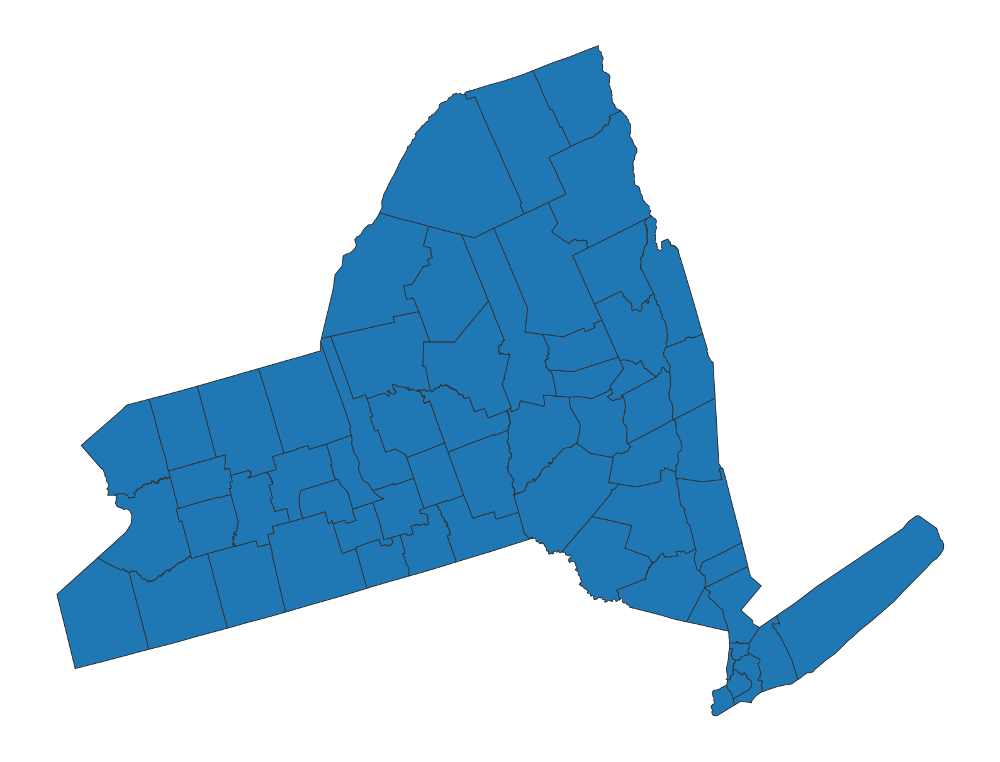

In [17]:
ny_county_gdf.plot(figsize=(10, 20), edgecolor="0.2", linewidth=0.5)
plt.axis("off")
plt.show()

### County subdivisions

For reporting purposes, the Census divides counties into _county subdivisions_. These subdivisions generally avoid dividing up preexisting political divisions: towns, cities, incorporated places, and the like. (For more on how county subdivisions are defined, see [chapter 8 of the _Geographic Areas Reference Manual_](https://www2.census.gov/geo/pdfs/reference/GARM/Ch8GARM.pdf).)

In [18]:
# alt source: https://web.archive.org/web/20241002180257if_/https://www2.census.gov/geo/tiger/TIGER2024/COUSUB/tl_2024_36_cousub.zip
!curl -O https://www2.census.gov/geo/tiger/TIGER2024/COUSUB/tl_2024_36_cousub.zip

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 4526k  100 4526k    0     0  11.3M      0 --:--:-- --:--:-- --:--:-- 11.3M


In [19]:
ny_cousub_gdf = gpd.read_file("tl_2024_36_cousub.zip").set_index("GEOID").to_crs("EPSG:2163")

In [20]:
ny_cousub_gdf.head(5)

,STATEFP,COUNTYFP,COUSUBFP,COUSUBNS,GEOIDFQ,NAME,NAMELSAD,LSAD,CLASSFP,MTFCC,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,geometry
GEOID,,,,,,,,,,,,,,,,
3601755959,36,017,55959,00979335,0600000US3601755959,Oxford,Oxford town,43,T1,G4040,A,155563470,911062,+42.3970735,-075.5962276,"POLYGON ((1961875.504 4567.571, 1961895.797 45..."
3601757507,36,017,57507,00979360,0600000US3601757507,Pharsalia,Pharsalia town,43,T1,G4040,A,100533127,774336,+42.5976196,-075.7338789,"POLYGON ((1944260.143 29128.119, 1944618.457 2..."
3601758288,36,017,58288,00979370,0600000US3601758288,Pitcher,Pitcher town,43,T1,G4040,A,73723906,37391,+42.5875820,-075.8279559,"POLYGON ((1937635.589 27005.517, 1937685.562 2..."
3601759817,36,017,59817,00979398,0600000US3601759817,Preston,Preston town,43,T1,G4040,A,89940325,830446,+42.5033261,-075.6103565,"POLYGON ((1956840.801 22763.914, 1956855.885 2..."
3601766894,36,017,66894,00979490,0600000US3601766894,Sherburne,Sherburne town,43,T1,G4040,A,112803620,51669,+42.6939737,-075.4812144,"POLYGON ((1959849.949 45897.012, 1959935.36 45..."


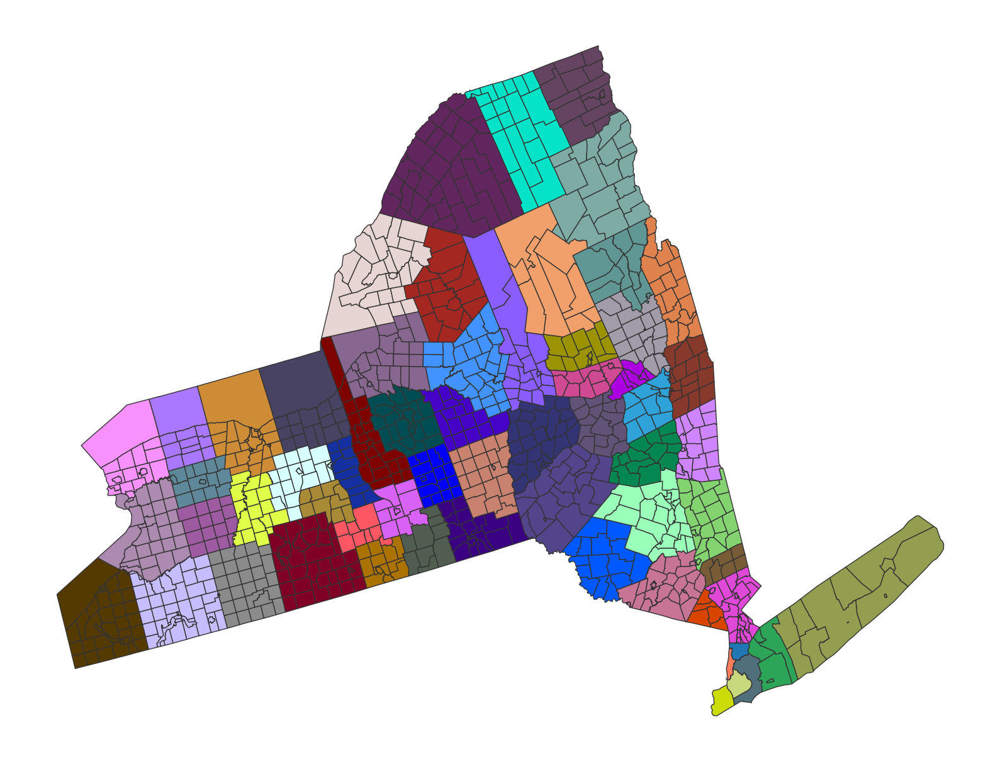

In [21]:
ny_cousub_gdf.plot(figsize=(10, 20), column="COUNTYFP", cmap=cc.cm.glasbey_hv, edgecolor="0.2", linewidth=0.5)
plt.axis("off")
plt.show()

### Tracts
Census tracts are immediately below counties on the central spine. While counties in New York (and most states) vary wildly in population, the populations of Census tracts are much more constrained: [according to the U.S. Census](https://www.census.gov/programs-surveys/geography/about/glossary.html#par_textimage_13), "Census tracts generally have a population size between 1,200 and 8,000 people, with an optimum size of 4,000 people". Because of this uniformity, the density of Census tracts roughly corresponds to population density. In the map below, observe the high density of small tracts in major population centers like New York City and the low density of large tracts in the sparsely populated upstate regions.

In [22]:
# alt source: https://web.archive.org/web/20241003052404if_/https://www2.census.gov/geo/tiger/TIGER2024/TRACT/tl_2024_36_tract.zip
!curl -O https://www2.census.gov/geo/tiger/TIGER2024/TRACT/tl_2024_36_tract.zip

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 8646k  100 8646k    0     0  21.2M      0 --:--:-- --:--:-- --:--:-- 21.3M


In [23]:
ny_tract_gdf = gpd.read_file("tl_2024_36_tract.zip").set_index("GEOID").to_crs("EPSG:2163")

In [24]:
ny_tract_gdf.head(5)

,STATEFP,COUNTYFP,TRACTCE,GEOIDFQ,NAME,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,geometry
GEOID,,,,,,,,,,,,,
36093033102,36,093,033102,1400000US36093033102,331.02,Census Tract 331.02,G5020,S,183329990,3232878,+42.7780248,-074.1727005,"POLYGON ((2055264.586 78050.871, 2055271.488 7..."
36093020102,36,093,020102,1400000US36093020102,201.02,Census Tract 201.02,G5020,S,854905,0,+42.8295375,-073.9161408,"POLYGON ((2082062.894 95284.55, 2082080.039 95..."
36093032504,36,093,032504,1400000US36093032504,325.04,Census Tract 325.04,G5020,S,65999125,1264687,+42.9010539,-074.0288936,"POLYGON ((2064585.726 105492.982, 2064979.986 ..."
36081003400,36,081,003400,1400000US36081003400,34,Census Tract 34,G5020,S,213987,0,+40.6847731,-073.8581871,"POLYGON ((2159378.165 -132226.337, 2159433.986..."
36081003900,36,081,003900,1400000US36081003900,39,Census Tract 39,G5020,S,146970,0,+40.7627994,-073.9409316,"POLYGON ((2150689.28 -125953.316, 2150710.253 ..."


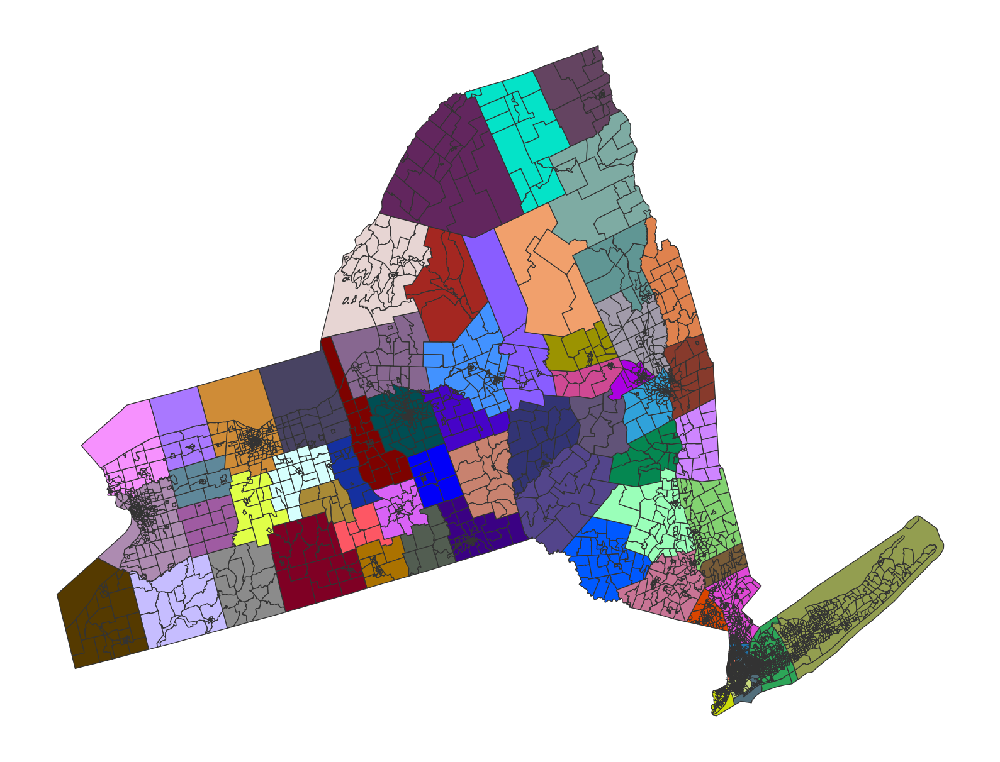

In [25]:
ny_tract_gdf.plot(figsize=(10, 20), column="COUNTYFP", cmap=cc.cm.glasbey_hv, edgecolor="0.2", linewidth=0.5)
plt.axis("off")
plt.show()

We can filter by FIPS code to zoom in on a particular county. Here is Kings County, which is coterminous with the borough of Brooklyn.

In [26]:
brooklyn_tract_gdf = ny_tract_gdf[ny_tract_gdf.COUNTYFP == "047"]

In [27]:
brooklyn_tract_gdf.head(5)

,STATEFP,COUNTYFP,TRACTCE,GEOIDFQ,NAME,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,geometry
GEOID,,,,,,,,,,,,,
36047021100,36,047,021100,1400000US36047021100,211,Census Tract 211,G5020,S,271830,0,+40.6970856,-073.9719259,"POLYGON ((2149833.91 -133632.831, 2150031.799 ..."
36047048500,36,047,048500,1400000US36047048500,485,Census Tract 485,G5020,S,581535,0,+40.7078399,-073.9363455,"POLYGON ((2152528.113 -131108.635, 2152686.219..."
36047062000,36,047,062000,1400000US36047062000,620,Census Tract 620,G5020,S,319578,34799,+40.5788518,-073.9460579,"POLYGON ((2155966.786 -145680.844, 2156040.377..."
36047080800,36,047,080800,1400000US36047080800,808,Census Tract 808,G5020,S,321836,0,+40.6573033,-073.9394864,"POLYGON ((2153831.736 -137151.752, 2154005.58 ..."
36047123700,36,047,123700,1400000US36047123700,1237,Census Tract 1237,G5020,S,321360,0,+40.6967384,-073.9567404,"POLYGON ((2151373.744 -133109.624, 2151436.766..."


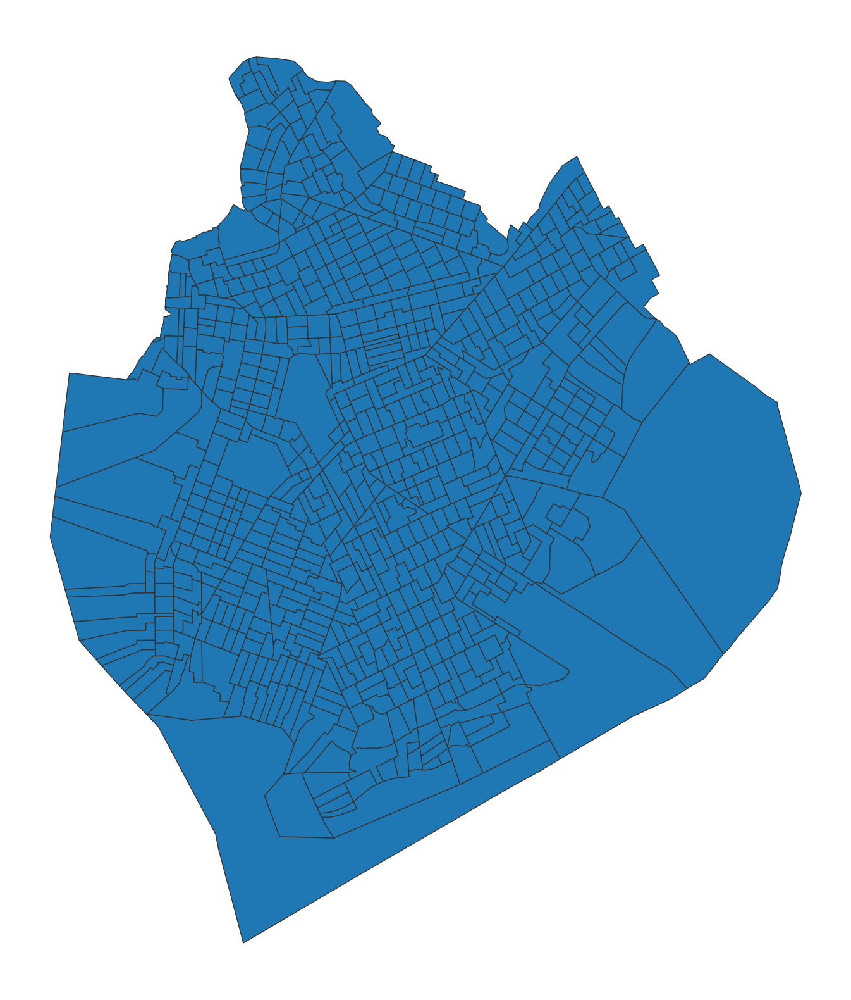

In [28]:
brooklyn_tract_gdf.plot(figsize=(10, 10), edgecolor="0.2", linewidth=0.5)
plt.axis("off")
plt.show()

We can see that Census tracts, being composed of census blocks (which are often themselves equal to city blocks), generally follow the city's grid.

<img width="512" alt="Brooklyn neighborhoods map" src="https://upload.wikimedia.org/wikipedia/commons/thumb/f/f2/Brooklyn_neighborhoods_map.png/512px-Brooklyn_neighborhoods_map.png?20090719024832">

_(image credit: <a href="https://commons.wikimedia.org/wiki/File:Brooklyn_neighborhoods_map.png">Peter Fitzgerald</a>, <a href="https://creativecommons.org/licenses/by/3.0">CC BY 3.0</a>, via Wikimedia Commons)_

# Introducing ACS data

In addition to publishing decennial data, the U.S. Census Bureau publishes [American Community Survey](https://www.census.gov/programs-surveys/acs) (ACS) data every year. The ACS is sent to a random sample of U.S. addresses; ACS data includes population estimates by race and ethnicity (which is useful for understanding demographic shifts between decennial Censuses), but it is also an invaluable source for understanding economic and social trends. As a simple example, let's take a look at a subset of the means of transportation data available in the ACS.

*Note:* You may eventually want to explore different kinds of information available from the ACS. One way to do this is to look at the associated documentation. Specifically, you can find relevant variables and table IDs by looking at the ["ACS Detailed Table Shells"](https://www.census.gov/programs-surveys/acs/technical-documentation/table-shells.2023.html#list-tab-79594641) located on the Census website. Additionally, we put together a [Google sheets workbook](https://docs.google.com/spreadsheets/d/1DtGNarbQLaJdtMiINQ7brQ-Y6zawBkkBkp0VGSENsZw/edit?usp=sharing) that organizes this information for the 2023-2015 ACS and the 2020 and 2010 decennial census.

In [29]:
brooklyn_subway_usage_raw = census.acs5.get(
    (
        # Means of Transportation to Work – Total
        "B08301_001E",
        # Means of Transportation to Work – Total – Public transportation (excluding taxicab) – Subway or elevated rail
        "B08301_012E",
    ),
    geo={
        "for": "tract:*",
        "in": f"state:36 county:047",
    },
    year=2022,
)

In [30]:
brooklyn_subway_usage_df = pd.DataFrame(brooklyn_subway_usage_raw).rename(
    columns={
        "B08301_001E": "commuter_count",
        "B08301_012E": "subway_commuter_count",
    }
)

In [31]:
brooklyn_subway_usage_df

,commuter_count,subway_commuter_count,state,county,tract
0,2731.0,1108.0,36,047,000100
1,618.0,243.0,36,047,000200
2,2219.0,994.0,36,047,000301
3,2271.0,734.0,36,047,000501
4,1596.0,844.0,36,047,000502
...,...,...,...,...,...
800,2630.0,939.0,36,047,122000
801,1716.0,107.0,36,047,123700
802,1212.0,509.0,36,047,150200
803,2126.0,539.0,36,047,152200


In [32]:
brooklyn_subway_usage_df["GEOID"] = (
    brooklyn_subway_usage_df["state"]
    + brooklyn_subway_usage_df["county"]
    + brooklyn_subway_usage_df["tract"]
)
brooklyn_subway_usage_df = brooklyn_subway_usage_df.set_index("GEOID")
brooklyn_subway_usage_df["subway_pct"] = 100 * brooklyn_subway_usage_df["subway_commuter_count"] / brooklyn_subway_usage_df["commuter_count"]

In [33]:
brooklyn_subway_usage_df.sort_values(by=["subway_pct"])

,commuter_count,subway_commuter_count,state,county,tract,subway_pct
GEOID,,,,,,
36047005302,41.0,0.0,36,047,005302,0.000000
36047070202,14.0,0.0,36,047,070202,0.000000
36047053700,942.0,0.0,36,047,053700,0.000000
36047047200,699.0,26.0,36,047,047200,3.719599
36047070601,1176.0,55.0,36,047,070601,4.676871
...,...,...,...,...,...,...
36047103402,0.0,0.0,36,047,103402,NaN
36047107002,0.0,0.0,36,047,107002,NaN
36047107003,0.0,0.0,36,047,107003,NaN


In [34]:
brooklyn_subway_usage_df = brooklyn_subway_usage_df[brooklyn_subway_usage_df.commuter_count > 0]

In [35]:
brooklyn_subway_usage_gdf = brooklyn_tract_gdf.join(brooklyn_subway_usage_df)

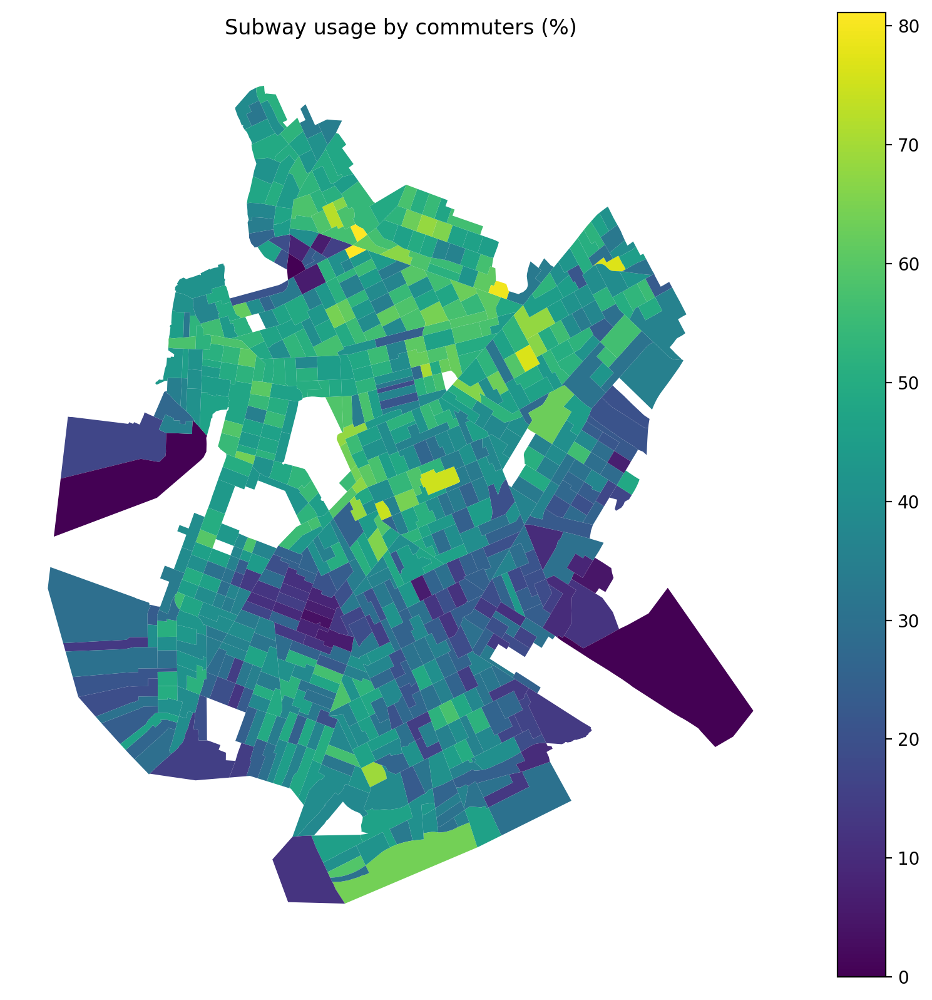

In [36]:
ax = brooklyn_subway_usage_gdf.plot(figsize=(10, 10), column="subway_pct", legend=True)
ax.axis("off")
ax.set_title("Subway usage by commuters (%)")
plt.show()

In [37]:
subway_map = folium.Map([40.65, -73.95], zoom_start=12)
folium.GeoJson(brooklyn_subway_usage_gdf).add_to(subway_map)
subway_map

In [38]:
subway_map = folium.Map([40.65, -73.95], zoom_start=12)
folium.Choropleth(
    geo_data=brooklyn_subway_usage_gdf,
    name="choropleth",
    data=brooklyn_subway_usage_gdf,
    columns=["NAMELSAD", "subway_pct"],
    key_on="feature.properties.NAMELSAD",
    fill_color="YlGn",
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name="Unemployment Rate (%)",
).add_to(subway_map)
subway_map

#Homework 3, due Thursday Feb 20, 1:25pm

(This takes the exam and Feb break into account.)

The **data product** part of your homework is to make an interesting choropleth using ACS data!  You pick the geography and the variables to visualize.

The **reading response** part of your homework comes from the Monmonier chapter.  Monmonier tells lots of stories of sloppy mapping, theft by mapping, and fights over mapping.  Pick one story and briefly describe whether/how the story involves dueling experts, physical tools, map notation, money, and legal authority.